In [1]:
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap.umap_ import UMAP
from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt
import numpy as np
import hdbscan
import scanpy as sc
import seaborn as sns


/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
mean_intensities = pd.read_csv('Expression_matrix_annotated_corrected.csv')

In [11]:
mean_intensities.shape

(23920, 36)

In [12]:
mean_intensities.head()

,CD31,GATA3,Caveolin1,CD20,Iridium,Fibronectin,CD45,CD44,CD34,panCK,...,CXCL12,VEGFR1,H3K27me3,vWF,CAIX,Vimentin,SMA,CK14,FSP1,E/P-Cadherin
0,0.235616,0.298464,16.832001,0.641398,7.863636,2.916076,2.700131,2.015895,0.143067,0.939394,...,0.433717,0.194141,3.181818,2.183246,0.572168,7.900826,3.348485,1.916342,1.818182,3.015607
1,-0.004600,0.144230,4.232795,0.153031,3.633333,0.824061,1.109655,0.427086,0.082651,0.233333,...,-0.000115,0.055966,0.333333,0.917532,0.268578,15.446370,2.700000,5.017887,0.433333,1.442548
2,0.250768,0.261829,5.619253,0.711746,7.242424,6.017854,2.817000,8.138438,1.095967,0.954545,...,0.841037,0.074706,3.015152,2.230429,0.637503,90.838660,2.515152,2.303101,2.272727,1.389134
3,0.275753,0.366653,4.955349,1.063171,14.366906,1.909099,2.857367,5.002996,0.947051,0.964029,...,1.628351,0.286391,3.604317,1.444366,0.726266,38.664586,2.611511,2.781479,2.503597,1.003206
4,0.179033,0.310635,0.332734,0.372303,7.564103,6.430027,0.937477,3.875437,0.168484,0.358974,...,-0.033714,0.077166,0.666667,1.598883,0.269830,0.762035,1.435897,1.768469,0.769231,3.892804


### Scaling

In [3]:
scaler = StandardScaler()
mean_intensities_scaled = scaler.fit_transform(mean_intensities)

In [4]:
mean_intensities_scaled.shape

(23920, 36)

### PCA

In [18]:
pca = PCA(n_components=2)
mean_intensities_pca = pca.fit_transform(mean_intensities_scaled)

In [20]:
mean_intensities_pca = pd.DataFrame(mean_intensities_pca, columns=['PC1', 'PC2'])

In [21]:
mean_intensities_pca.head()

,PC1,PC2
0,-2.864790,-1.281606
1,-4.859933,-1.709044
2,-1.837049,-0.160147
3,-1.880426,-0.478799
4,-4.516735,-2.366579


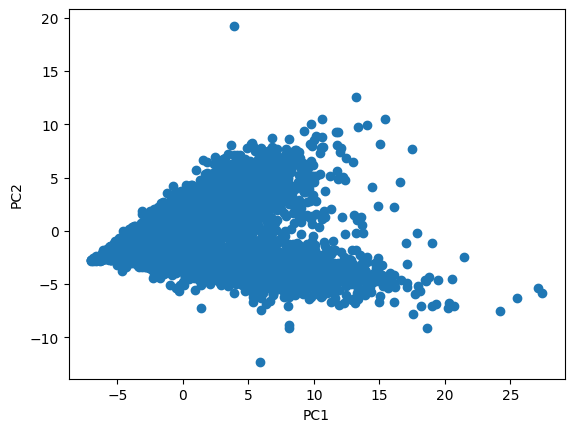

In [25]:
scatter = plt.scatter(mean_intensities_pca['PC1'], mean_intensities_pca['PC2'])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

### TSNE

In [32]:
tsne = TSNE(n_components = 2)
mean_intensities_tsne = tsne.fit_transform(mean_intensities_scaled)

Exception ignored on calling ctypes callback function <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7d5b22f0fe20>:
Traceback (most recent call last):
  File "/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/threadpoolctl.py", line 1175, in _make_controller_from_path
    lib_controller = controller_class(
  File "/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/home/bostlab2/miniconda3/envs/code/lib/python3.13/ctypes/__init__.py", line 390, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: /home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/numpy.libs/libscipy_openblas64_-6bb31eeb.so: canno

In [ ]:
mean_intensities_tsne = pd.DataFrame(mean_intensities_tsne, columns=['tSNE1', 'tSNE2'])

In [34]:
mean_intensities_tsne.head()

,tSNE1,tSNE2
0,-40.168030,-45.387405
1,-51.976974,-46.020638
2,-15.758324,-47.698021
3,-17.682508,-40.872517
4,-62.036377,-51.290016


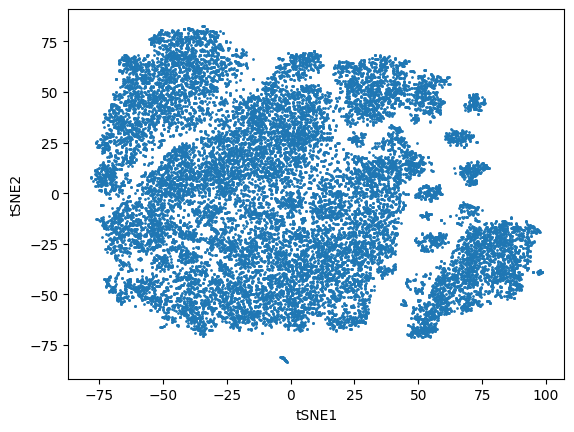

In [37]:
scatter = plt.scatter(mean_intensities_tsne['tSNE1'], mean_intensities_tsne['tSNE2'], 
                        s = 1)
plt.xlabel('tSNE1')
plt.ylabel('tSNE2')
plt.show()

### UMAP

In [9]:
umap = UMAP(n_components = 2)
mean_intensities_umap = umap.fit_transform(mean_intensities_scaled)

In [10]:
mean_intensities_umap = pd.DataFrame(mean_intensities_umap, columns=['UMAP1', 'UMAP2'])

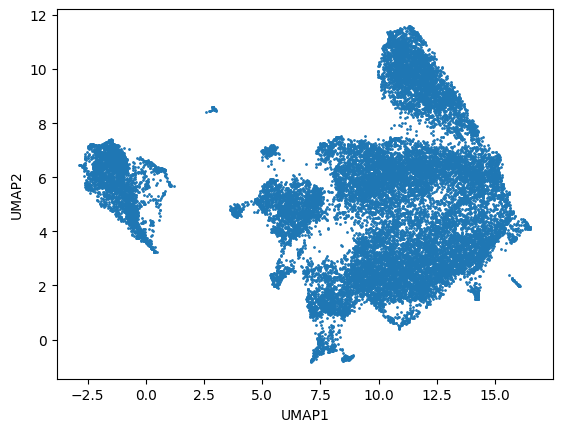

In [11]:
scatter = plt.scatter(mean_intensities_umap['UMAP1'], mean_intensities_umap['UMAP2'],
                        s = 1)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()

### HDBSCAN

In [23]:
hdbscan_cluster = hdbscan.HDBSCAN(min_cluster_size=10)
labels = hdbscan_cluster.fit_predict(mean_intensities_umap)


In [24]:
np.unique(labels).shape

(6,)

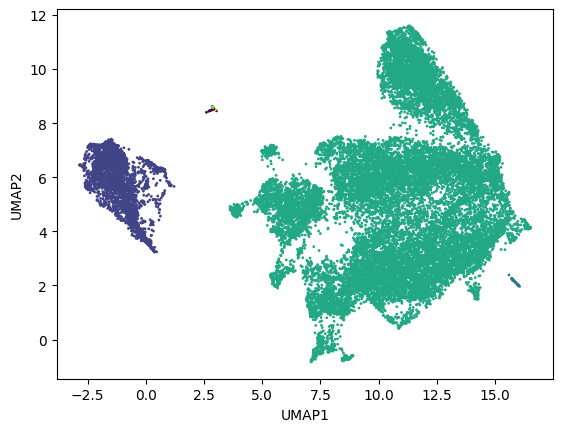

In [25]:
scatter = plt.scatter(mean_intensities_umap['UMAP1'], mean_intensities_umap['UMAP2'],
                        s = 1, c = labels, cmap = 'viridis')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()

### Louvain Clustering with scanpy

In [4]:
mean_intensities.columns

Index(['CD31', 'GATA3', 'Caveolin1', 'CD20', 'Iridium', 'Fibronectin', 'CD45',
       'CD44', 'CD34', 'panCK', 'CD140b', 'CD4', 'cPARP_cCaspase3', 'VEGF',
       'VCAM1', 'CD68', 'CD3', 'CD8a', 'Iridium.1', 'ICAM-1', 'Podoplanin',
       'ZO-1', 'MMP14', 'Ki-67', 'MMP9', 'CXCL13', 'CXCL12', 'VEGFR1',
       'H3K27me3', 'vWF', 'CAIX', 'Vimentin', 'SMA', 'CK14', 'FSP1',
       'E/P-Cadherin'],
      dtype='object')

In [5]:
tags_name = np.array(mean_intensities.columns)

In [6]:
tags_name.shape

(36,)

In [7]:
mean_intensities_scaled = pd.DataFrame(mean_intensities_scaled, columns = tags_name)

In [8]:
mean_intensities_scaled

,CD31,GATA3,Caveolin1,CD20,Iridium,Fibronectin,CD45,CD44,CD34,panCK,...,CXCL12,VEGFR1,H3K27me3,vWF,CAIX,Vimentin,SMA,CK14,FSP1,E/P-Cadherin
0,-0.813529,-0.387422,0.450041,-0.624566,-0.959777,-0.346404,-0.427433,-0.792580,-0.775673,-0.348972,...,-0.407337,-0.673281,-0.527690,-0.346736,-0.473796,-0.708031,-0.758083,-0.729746,-0.501942,-0.000758
1,-1.139563,-0.501125,-0.587448,-1.254113,-1.536333,-0.657629,-1.456853,-1.180946,-0.851323,-0.391658,...,-0.497681,-1.108582,-1.371762,-0.889637,-0.742306,-0.534919,-0.801565,1.052236,-1.338505,-0.351198
2,-0.792964,-0.414430,-0.473279,-0.533882,-1.044443,0.115041,-0.351791,0.704001,0.417495,-0.348056,...,-0.322515,-1.049545,-0.577078,-0.326497,-0.416010,1.194751,-0.813959,-0.507535,-0.227359,-0.363098
3,-0.759054,-0.337153,-0.527949,-0.080865,-0.073434,-0.496210,-0.325664,-0.062420,0.231031,-0.347483,...,-0.158560,-0.382659,-0.402494,-0.663663,-0.337504,-0.002241,-0.807498,-0.232684,-0.087894,-0.449073
4,-0.890326,-0.378449,-0.908601,-0.971453,-1.000601,0.176359,-1.568293,-0.338038,-0.743847,-0.384062,...,-0.504678,-1.041794,-1.272988,-0.597386,-0.741199,-0.871811,-0.886324,-0.814706,-1.135595,0.194660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23915,-0.060503,-0.332487,-0.415297,0.560878,-1.189925,-0.556636,3.637134,-0.964599,-0.570655,-0.337751,...,-0.276842,-0.577965,-0.870482,-0.850056,0.102008,-0.768857,4.088126,1.627853,0.196872,-0.170219
23916,-0.764997,-0.310350,-0.785288,0.984269,0.819733,0.298337,2.125659,0.214428,-0.641478,-0.276321,...,-0.393640,-0.811041,0.805515,1.061369,-0.277225,-0.773748,-0.848912,0.609037,-0.822008,-0.470173
23917,-0.605916,-0.458035,-0.583390,-0.916085,-1.317476,0.430592,-0.771429,-1.074541,-0.815656,-0.358451,...,-0.432782,-0.923137,-1.071145,-1.122464,-0.653127,-0.424775,0.663061,0.043605,-0.956795,-0.494206
23918,-0.214666,1.708683,-0.251421,0.974821,0.643519,1.589945,0.728761,-0.100195,-0.393793,0.696350,...,0.532184,1.289872,1.073056,1.165573,0.423897,0.978854,-0.374146,1.612544,0.136933,0.670315


In [9]:
adata = sc.AnnData(X = mean_intensities_scaled)


/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [10]:
adata.var

""
CD31
GATA3
Caveolin1
CD20
Iridium
Fibronectin
CD45
CD44
CD34
panCK


In [11]:
adata.X

array([[-8.13529140e-01, -3.87421945e-01,  4.50041422e-01, ...,
        -7.29745974e-01, -5.01941758e-01, -7.58287586e-04],
       [-1.13956280e+00, -5.01124920e-01, -5.87447984e-01, ...,
         1.05223562e+00, -1.33850520e+00, -3.51198089e-01],
       [-7.92963864e-01, -4.14429749e-01, -4.73279237e-01, ...,
        -5.07534921e-01, -2.27358572e-01, -3.63097609e-01],
       ...,
       [-6.05916421e-01, -4.58034763e-01, -5.83390080e-01, ...,
         4.36048077e-02, -9.56794774e-01, -4.94205909e-01],
       [-2.14666007e-01,  1.70868328e+00, -2.51421419e-01, ...,
         1.61254414e+00,  1.36933158e-01,  6.70315431e-01],
       [-7.24395348e-01, -7.92728530e-02, -8.02733671e-01, ...,
         6.77123499e-01, -5.25292139e-01, -4.28573822e-01]])

/tmp/ipykernel_25901/1277666835.py:4: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_pp, key_added="groups")


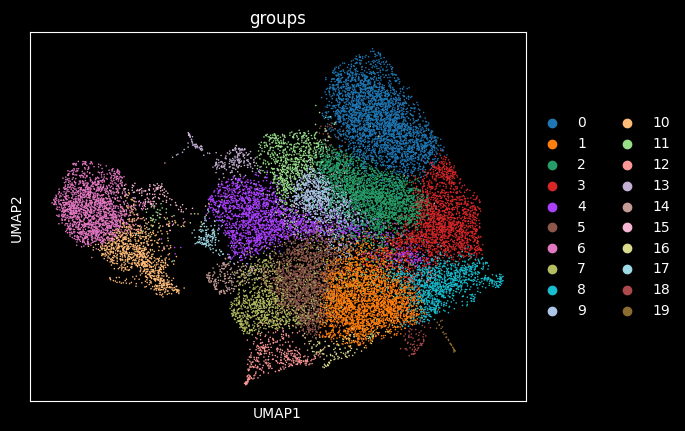

In [12]:
adata_pp = adata.copy()

sc.pp.neighbors(adata_pp, n_pcs = 15)
sc.tl.leiden(adata_pp, key_added="groups")

sc.tl.umap(adata_pp)  # Compute UMAP
sc.pl.umap(adata_pp, color="groups", legend_loc="right margin")

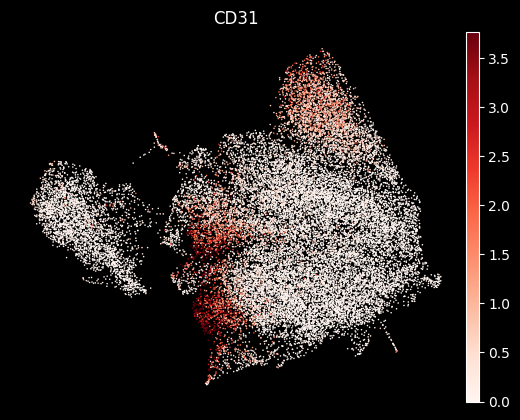

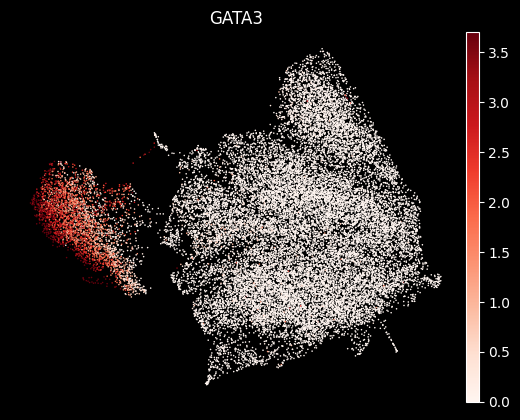

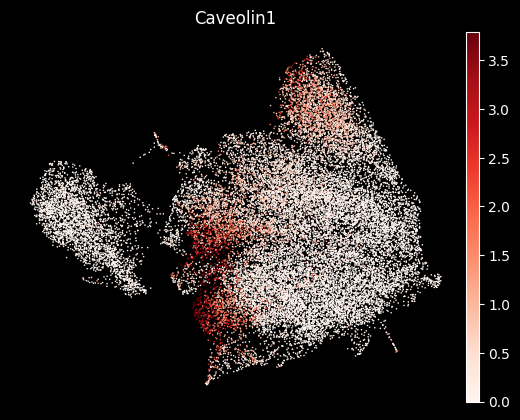

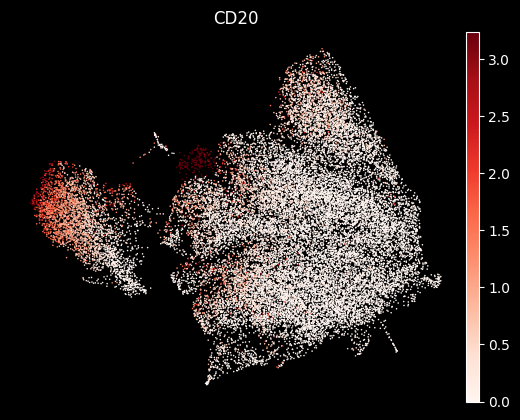

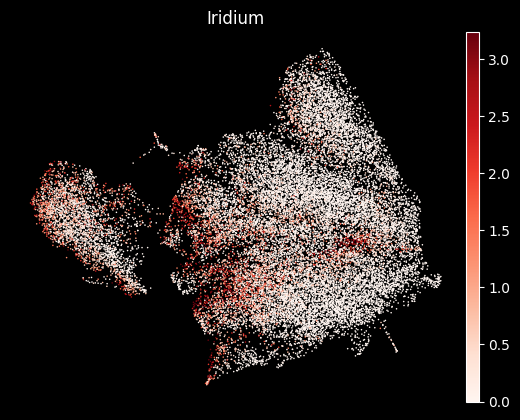

...

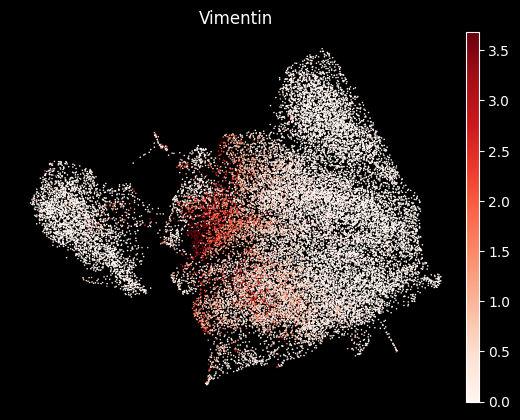

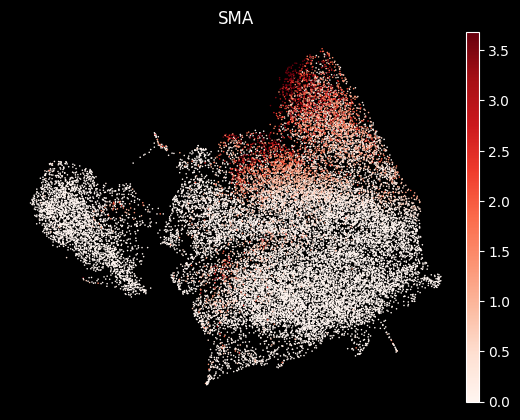

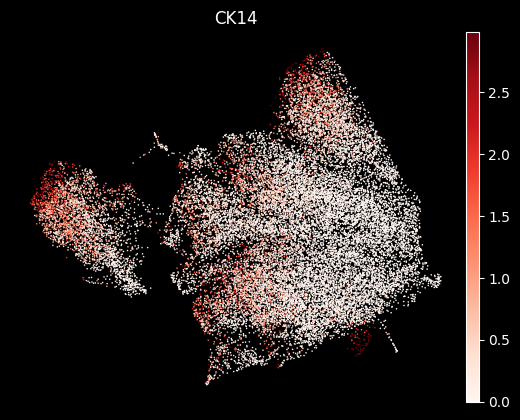

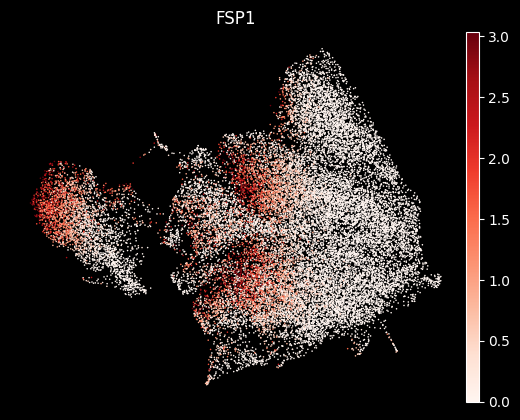

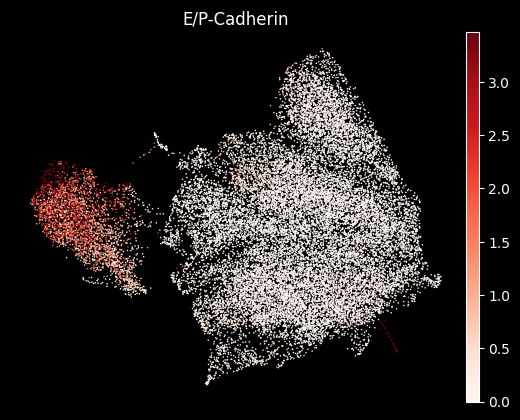

In [13]:
for tag in tags_name:
    sc.pl.umap(
            adata_pp,
            color = tag,
            vmin=0,
            vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
            sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
            frameon=False,
            cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
        )

In [14]:
sc.tl.rank_genes_groups(adata_pp, groupby="groups", method="wilcoxon")

/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/bostlab2/miniconda3/envs/code/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.st

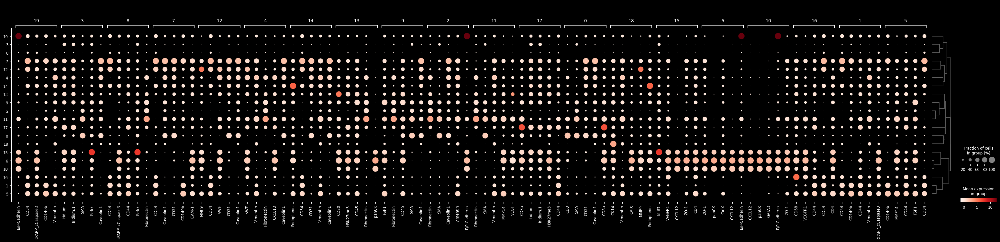

In [15]:
sc.pl.rank_genes_groups_dotplot(adata_pp, n_genes = 5)  # Adjust n_genes as needed

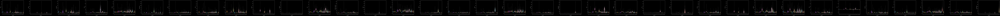

In [16]:
sc.pl.violin(adata_pp
             , keys=tags_name
             , groupby='groups'
             , inner='box')

In [17]:
markers_to_cells = {
    "17": "Cytotoxic T cells (CD8a)",
    "13": "B cells (CD20)",
    "16": "Macrophages (CD68)",
    "19": "Epithelial cells (E/P Cadherin)",
    "6": "Breast cancer cells (PanCK, GATA3)",
    "10": "Potentially breast cancer (PanCK, GATA3)",
    "15": "Potentially breast cancer (PanCK, GATA3, CAIX)",
    "0": "Some T cells (CD3)",
    "12": "MMP9 High cells",
    "11": "Potentional fibroblasts (fibronectin)",
    "2": "Potentially fibroblasts (fibronectin)",
    "9": "Potentially fibroblasts (fibronectin)",
    "4": "Potentially fibroblasts (fibronectin)",
    "14": "Potentially malignant cells (CD34, Podoplanin)"

    
}

In [18]:
adata_pp.obs["manual_celltype_annotation"] = adata_pp.obs.groups.map(markers_to_cells)

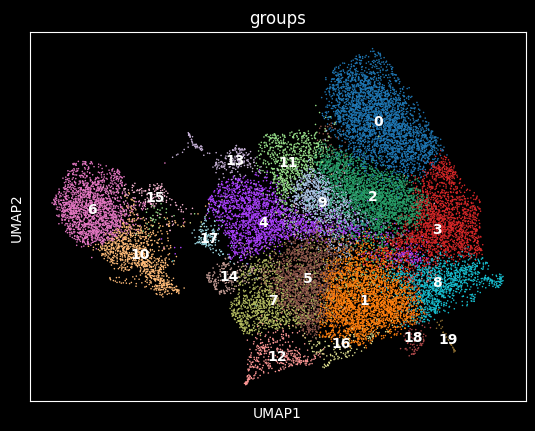

In [19]:
sc.pl.umap(adata_pp, color="groups", legend_loc="on data")

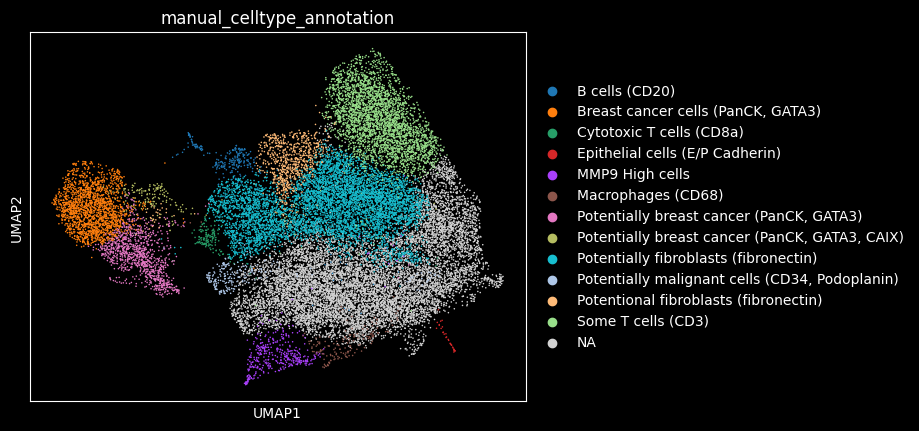

In [20]:
sc.pl.umap(adata_pp, color=["manual_celltype_annotation"])

### Concordance with 3D data

In [21]:
clusters = np.array(adata_pp.obs["groups"]).astype(str)

In [22]:
clusters

array(['8', '8', '1', ..., '3', '6', '4'], dtype='<U2')

In [23]:
cells = adata_pp.obs["manual_celltype_annotation"].astype('category')
cells = cells.cat.add_categories(['Unknown'])

In [24]:
cells.fillna('Unknown', inplace = True)

In [25]:
cells = np.array(cells)

In [26]:
coordinates = pd.read_csv('New_cell_properties.csv', index_col = 0)
coordinates["Clusters"] = clusters
coordinates["Cells"] = cells
coordinates['Z'] = coordinates['Z'] * 2

In [27]:
coordinates['X'].max()

np.float64(1017.3484848484848)

In [28]:
coordinates

,Area,X,Y,Z,Clusters,Cells
0,66,1017.348485,468.636364,63.636364,8,Unknown
1,30,969.366667,441.633333,64.000000,8,Unknown
2,66,925.363636,528.500000,63.636364,1,Unknown
3,139,915.071942,566.043165,63.366906,1,Unknown
4,39,912.128205,529.871795,64.000000,8,Unknown
...,...,...,...,...,...,...
23915,40,368.750000,753.500000,0.000000,0,Some T cells (CD3)
23916,163,367.478528,450.975460,1.558282,4,Potentially fibroblasts (fibronectin)
23917,46,367.913043,572.000000,0.000000,3,Unknown
23918,161,366.049689,538.677019,1.540373,6,"Breast cancer cells (PanCK, GATA3)"


In [29]:
import plotly.express as px
import pandas as pd

# Create a DataFrame with your coordinates and cluster information
df = pd.DataFrame({
    'X': coordinates['X'],
    'Y': coordinates['Y'],
    'Z': coordinates['Z'],
    'Clusters': coordinates['Clusters']
})

fig = px.scatter_3d(df, x='X', y='Y', z='Z', color='Clusters', title='Interactive 3D Scatter',
                    opacity=0.7)
fig.update_traces(marker=dict(size=1))

fig.update_layout(
    scene=dict(
        xaxis=dict(range=[0, 900]),
        yaxis=dict(range=[0, 900]),
        zaxis=dict(range=[0, 200])
    )
)
fig.show()


In [30]:
import plotly.express as px
import pandas as pd

# Create a DataFrame with your coordinates and cluster information
df = pd.DataFrame({
    'X': coordinates['X'],
    'Y': coordinates['Y'],
    'Z': coordinates['Z'],
    'Cells': coordinates['Cells']
})

fig = px.scatter_3d(df, x='X', y='Y', z='Z', color='Cells', title='Interactive 3D Scatter',
                    opacity=0.7)
fig.update_traces(marker=dict(size=1))

fig.update_layout(
    scene=dict(
        xaxis=dict(range=[0, 900]),
        yaxis=dict(range=[0, 900]),
        zaxis=dict(range=[0, 200])
    )
)
fig.show()


In [27]:
coordinates.to_csv('cell_coordinates_clusters.csv')

### Statistics

In [ ]:
coordinates[coordinates['Clusters'] == '6'] # Breast cancer cells (1796)

,Area,X,Y,Z,Clusters,Cells
440,53,542.924528,518.207547,64.000000,6,"Breast cancer cells (PanCK, GATA3)"
473,54,528.777778,628.222222,64.000000,6,"Breast cancer cells (PanCK, GATA3)"
545,135,496.222222,581.251852,63.451852,6,"Breast cancer cells (PanCK, GATA3)"
551,40,493.075000,571.925000,64.000000,6,"Breast cancer cells (PanCK, GATA3)"
552,37,493.135135,543.297297,64.000000,6,"Breast cancer cells (PanCK, GATA3)"
...,...,...,...,...,...,...
23909,82,379.914634,474.378049,0.268293,6,"Breast cancer cells (PanCK, GATA3)"
23911,42,377.666667,529.000000,0.000000,6,"Breast cancer cells (PanCK, GATA3)"
23913,79,371.265823,516.468354,0.430380,6,"Breast cancer cells (PanCK, GATA3)"
23914,56,370.875000,473.696429,0.000000,6,"Breast cancer cells (PanCK, GATA3)"


In [ ]:
coordinates[coordinates['Clusters'] == '17'] # Cytotoxic T cells (CD8a) (148)

,Area,X,Y,Z,Clusters,Cells
33,91,833.538462,602.351648,63.736264,17,Cytotoxic T cells (CD8a)
318,91,606.912088,596.571429,63.450549,17,Cytotoxic T cells (CD8a)
486,60,523.250000,685.400000,63.400000,17,Cytotoxic T cells (CD8a)
605,115,474.208696,454.643478,63.095652,17,Cytotoxic T cells (CD8a)
902,136,343.088235,546.073529,63.264706,17,Cytotoxic T cells (CD8a)
...,...,...,...,...,...,...
23434,68,575.602941,418.764706,0.647059,17,Cytotoxic T cells (CD8a)
23440,115,574.321739,638.104348,0.556522,17,Cytotoxic T cells (CD8a)
23476,83,556.012048,824.228916,0.000000,17,Cytotoxic T cells (CD8a)
23605,168,511.333333,792.744048,0.797619,17,Cytotoxic T cells (CD8a)


In [ ]:
coordinates[coordinates['Clusters'] == '16'] # Macrophages (167)

,Area,X,Y,Z,Clusters,Cells
316,140,608.892857,170.878571,63.314286,16,Macrophages (CD68)
330,49,599.653061,450.346939,64.000000,16,Macrophages (CD68)
388,87,567.850575,161.137931,63.310345,16,Macrophages (CD68)
704,35,434.428571,823.228571,64.000000,16,Macrophages (CD68)
914,36,336.083333,424.027778,64.000000,16,Macrophages (CD68)
...,...,...,...,...,...,...
22994,71,878.591549,213.239437,0.676056,16,Macrophages (CD68)
23566,78,522.641026,821.794872,0.743590,16,Macrophages (CD68)
23690,83,482.277108,278.000000,0.481928,16,Macrophages (CD68)
23716,49,471.285714,472.795918,0.000000,16,Macrophages (CD68)


In [ ]:
coordinates[coordinates['Clusters'] == '13'] # B-cells (258)

,Area,X,Y,Z,Clusters,Cells
110,180,754.744444,733.461111,62.544444,13,B cells (CD20)
380,112,572.375000,155.107143,63.339286,13,B cells (CD20)
428,225,550.853333,243.977778,62.844444,13,B cells (CD20)
697,36,437.305556,451.305556,64.000000,13,B cells (CD20)
958,80,301.862500,517.137500,64.000000,13,B cells (CD20)
...,...,...,...,...,...,...
23311,129,649.441860,650.085271,0.775194,13,B cells (CD20)
23357,57,621.666667,453.122807,0.000000,13,B cells (CD20)
23368,160,613.368750,616.787500,1.012500,13,B cells (CD20)
23728,157,461.923567,426.337580,0.789809,13,B cells (CD20)
